In [70]:
import pandas as pd
import pyod as py
from sklearn.preprocessing import StandardScaler
from pretty_confusion_matrix import pp_matrix_from_data
import plotly.express as px
import matplotlib.pyplot as plt

In [154]:
df = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [155]:
df

,Unnamed: 0,Node 11,Link 21,Link 22,Pressure 10
0,0,-0.560490,8.324737,2.527433,0.193668
1,1,-0.560490,9.043777,1.537900,0.205012
2,2,-0.840344,9.043777,1.537900,0.217237
3,3,-0.840344,9.762817,1.537900,0.229711
4,4,-0.840344,9.762817,1.537900,0.241821
...,...,...,...,...,...
17515,17515,0.558925,-0.303745,-0.441167,0.671786
17516,17516,-0.000783,0.415295,-0.441167,0.711009
17517,17517,-0.000783,-0.303745,-0.441167,0.735842
17518,17518,-0.000783,0.415295,-0.441167,0.768762


In [156]:
from pyod.models.pca import PCA

In [239]:
model=PCA(contamination=0.3)

on train le model sur le scénario 506 

In [244]:
model.fit(df)

PCA(contamination=0.3, copy=True, iterated_power='auto', n_components=None,
  n_selected_components=None, random_state=None, standardization=True,
  svd_solver='auto', tol=0.0, weighted=True, whiten=False)

In [196]:
y_train = model.predict(df) 

In [197]:
y_train=pd.DataFrame(y_train)
y_train

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


on convertit en time serie

In [198]:
time = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/Timestamps.csv')
y_train.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_train

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [199]:
y_train.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/pred_data.csv')
y_train = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

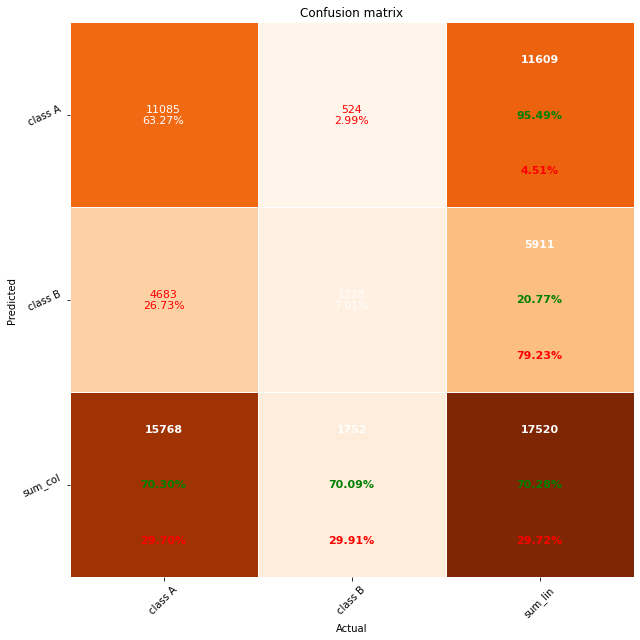

In [200]:
pp_matrix_from_data (y_train['0'],y["Label"])

In [201]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [202]:
fig = px.line(y_train.reset_index(), x='timestamp', y='0', title='Anomaly pred')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

résultat assez satisfaisant , on remarque que les anomalies sont bien prédites surtout au début de la fuite ,
avant les anomalies detectées ne durent pas plus d'un jour
à partir de la fin de fuite, les anomalies sont très peu présentes

prediction sur scénario 505 abrupt mais avec 20% de perte 

In [203]:
test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [204]:
y_test = model.predict(test)

In [205]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [206]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [207]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [208]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [209]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [210]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

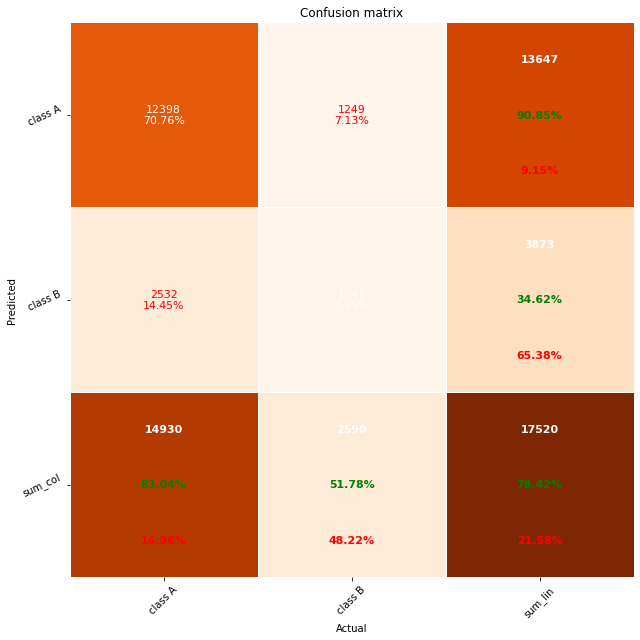

In [211]:
pp_matrix_from_data(y_test['0'],y['Label'])

on a un super résultat !

prediction sur scénario 5 abrupt avec 5%
a noter que pour ce scénario le dataset est beaucoup plus corrélé qu'avant, voir si avec df_full c'est plus efficace sur tout les scénario 

In [247]:
x = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [248]:
y_test = model.predict(x)

In [249]:
y_test

array([1, 1, 1, ..., 0, 0, 1])

In [250]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [251]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [252]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [253]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [254]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

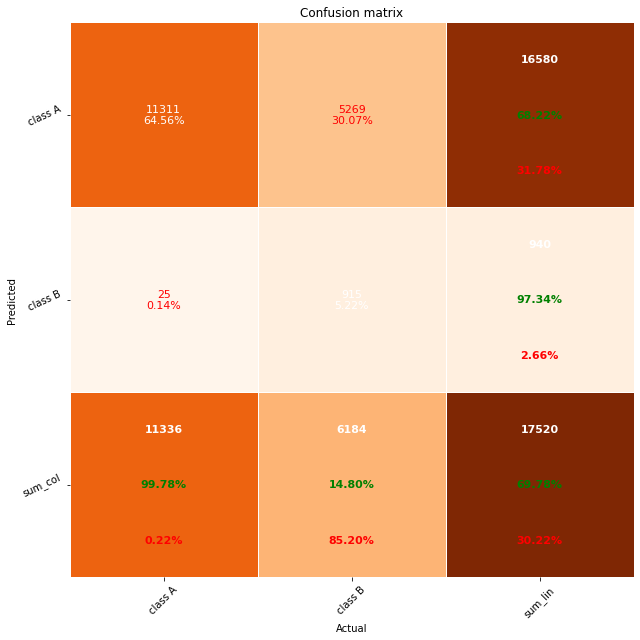

In [255]:
pp_matrix_from_data(y_test['0'],y['Label'])

on detecte beaucoup de fausse anomalies, idée : entrainer model sur scénario avec moins de fuite car l'important ici est de detecter le début d'une fuite pas toute la fuite
donc on pourrais voir si modèle a 15% réduit les fausses anomalie tout en prédisant aussi bien le début des fuites

essaye sur scénario 4 sans fuite 

In [256]:
x_4 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [257]:
y_test = model.predict(x_4)

In [258]:
y_test

array([1, 1, 1, ..., 0, 0, 1])

In [259]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [260]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [261]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [262]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [263]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

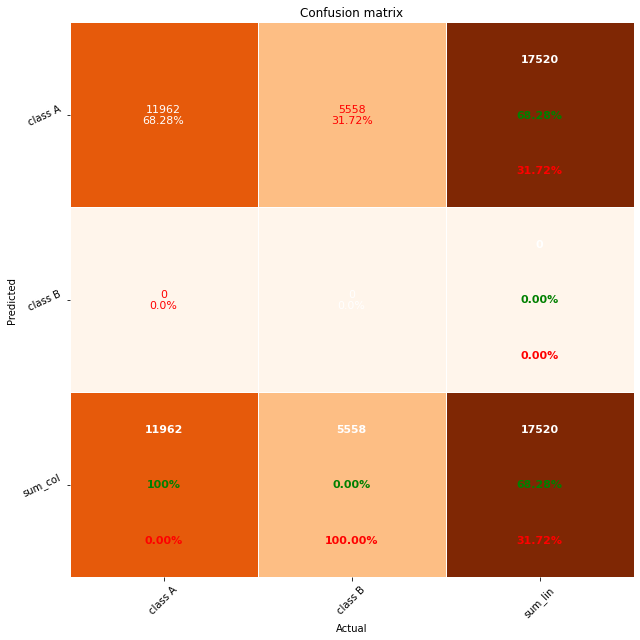

In [264]:
pp_matrix_from_data(y_test['0'],y['Label'])

on a 30% de fausse cependant quand on regarde plus précisement les prédictions, on a rarement plus d'un jour de prédis anormal.
introduire un seuil de de X h (12h par exemple) prédites anormales d'affilée peut permettre aux techniciens de moins se déplacer 

scénario 1 incipient avec 70%

In [185]:
x_1 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-507/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-507/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [186]:
y_test = model.predict(x_1)

In [187]:
y_test

array([1, 1, 1, ..., 0, 0, 1])

In [188]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,0
17518,0


In [189]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,0
17518,2017-12-31 23:00:00,0


In [190]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-1/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-1/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [191]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [192]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

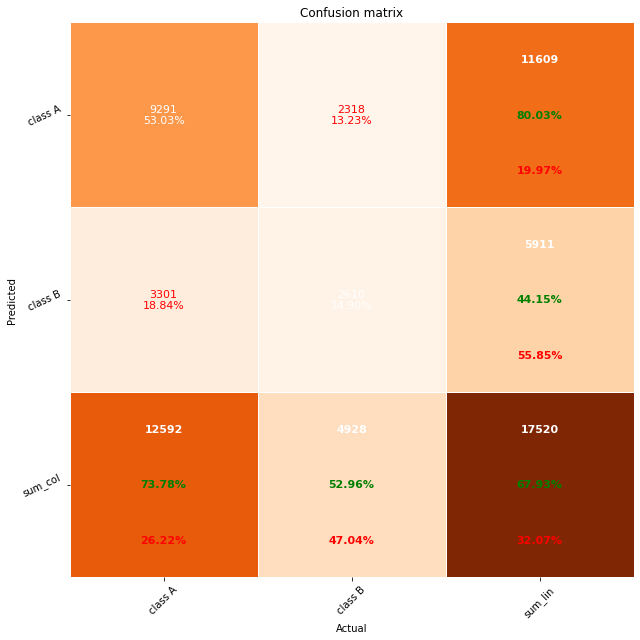

In [193]:
pp_matrix_from_data(y_test['0'],y['Label'])

algo detecte bien debut de fuite, c'est peut etre le cas le plus complexe
question : notre algo estime que ya toujours 30% de fuite, est ce que ca marcherais aussi bien 

scénario 16, 2 fuites abrupt

In [166]:
x_16 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-16/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-16/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [167]:
y_test = model.predict(x_16)

In [168]:
y_test

array([1, 1, 1, ..., 1, 0, 1])

In [169]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,1
17518,0


In [170]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,1
17518,2017-12-31 23:00:00,0


In [171]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-16/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-16/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [172]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [173]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

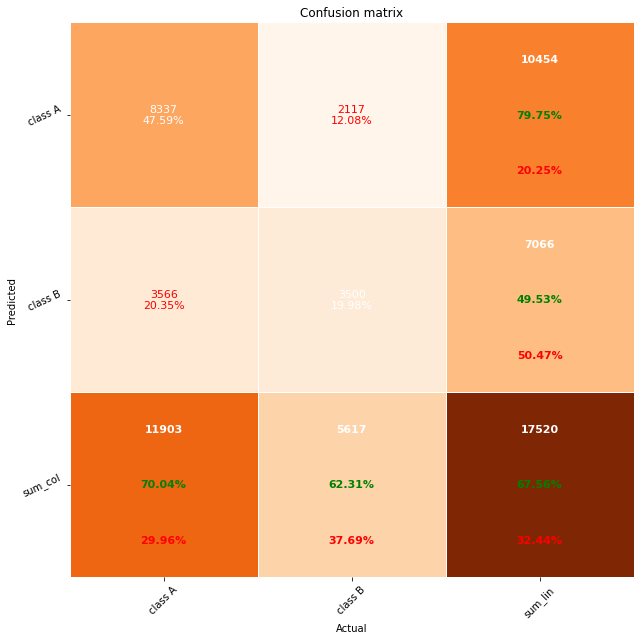

In [174]:
pp_matrix_from_data(y_test['0'],y['Label'])

2ème phase predite à 100% mais la première est très mal prédites car la 1ère fuite était minime en comparaison à la 2ème
peut etre que ce serait mieux detecter si on supprimait la 2ème fuite

scénario 3, 2 fuites incipient 

In [175]:
x_3 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [176]:
y_test = model.predict(x_16)

In [177]:
y_test

array([1, 1, 1, ..., 1, 0, 1])

In [178]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,1
1,1
2,1
3,1
4,1
...,...
17515,0
17516,0
17517,1
17518,0


In [179]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,1
1,2017-01-01 00:30:00,1
2,2017-01-01 01:00:00,1
3,2017-01-01 01:30:00,1
4,2017-01-01 02:00:00,1
...,...,...
17515,2017-12-31 21:30:00,0
17516,2017-12-31 22:00:00,0
17517,2017-12-31 22:30:00,1
17518,2017-12-31 23:00:00,0


In [180]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-3/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [181]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [182]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

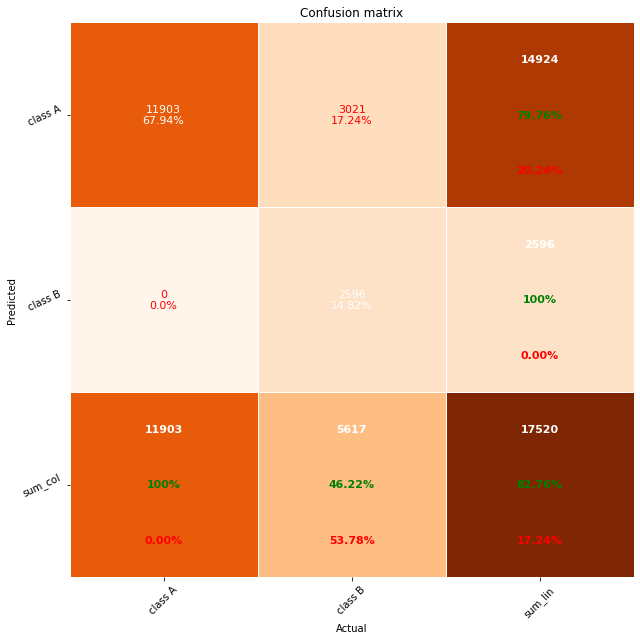

In [183]:
pp_matrix_from_data(y_test['0'],y['Label'])

alors la on prédit la fuite 1 semaine avant ... solution : envoyer les techniciens 1 fois/jours ?